/tmp/ipykernel_468732/2683713460.py:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xticks(np.arange(0, len(sample_data[0]), step=10))  # Adjust step size as needed


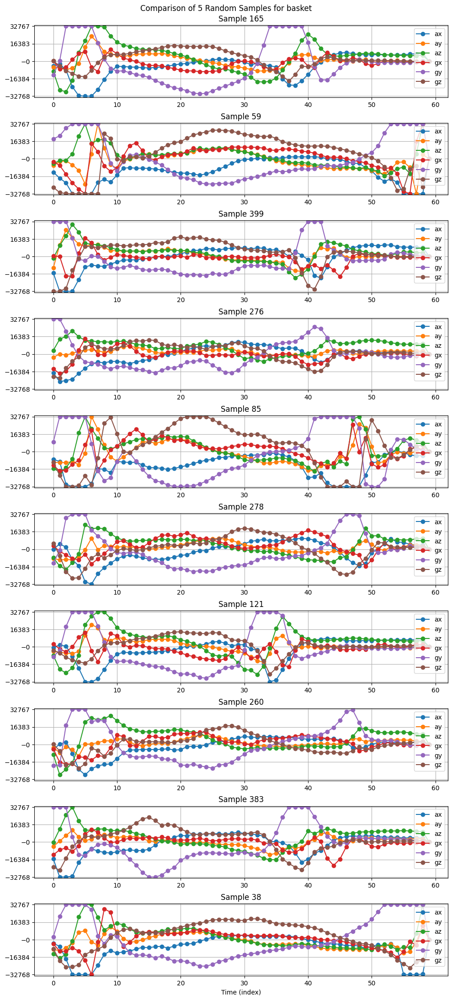

Y-axis limits: -32768.0 to 32767.0


/tmp/ipykernel_468732/2683713460.py:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xticks(np.arange(0, len(sample_data[0]), step=10))  # Adjust step size as needed


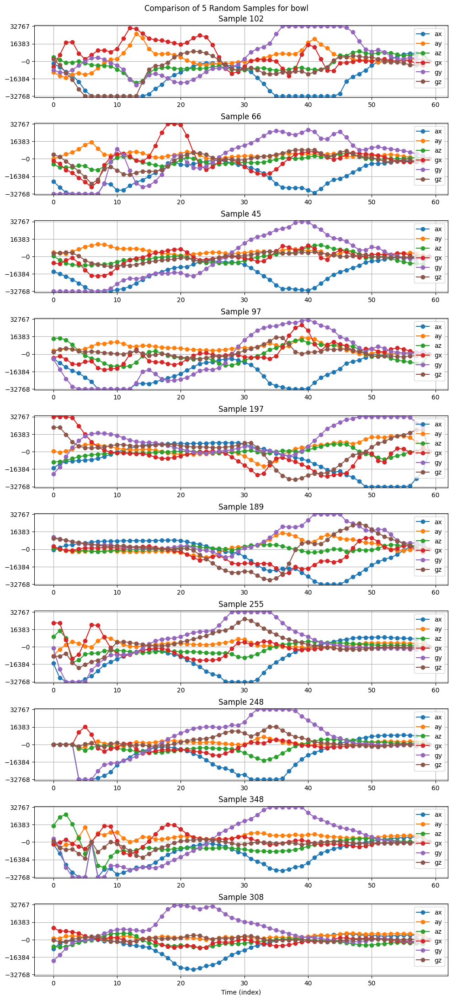

Y-axis limits: -32768.0 to 32767.0


/tmp/ipykernel_468732/2683713460.py:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xticks(np.arange(0, len(sample_data[0]), step=10))  # Adjust step size as needed


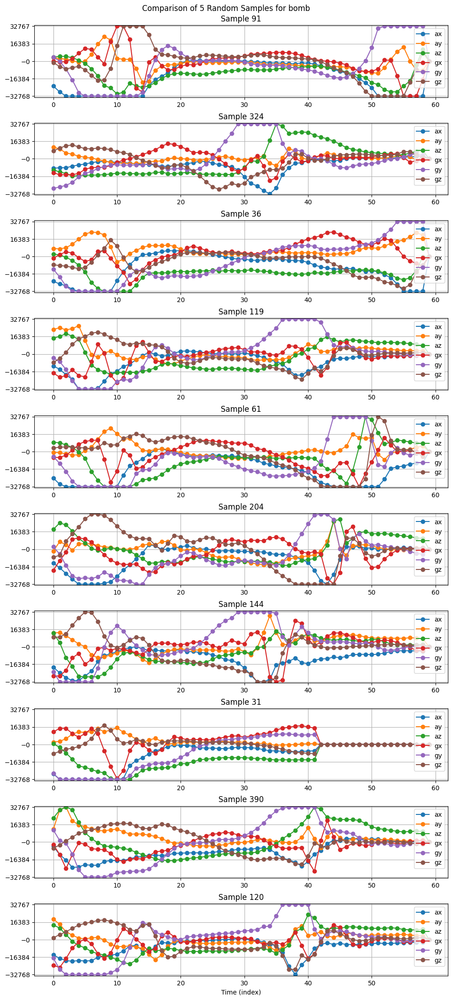

Y-axis limits: -32768.0 to 32767.0


/tmp/ipykernel_468732/2683713460.py:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xticks(np.arange(0, len(sample_data[0]), step=10))  # Adjust step size as needed


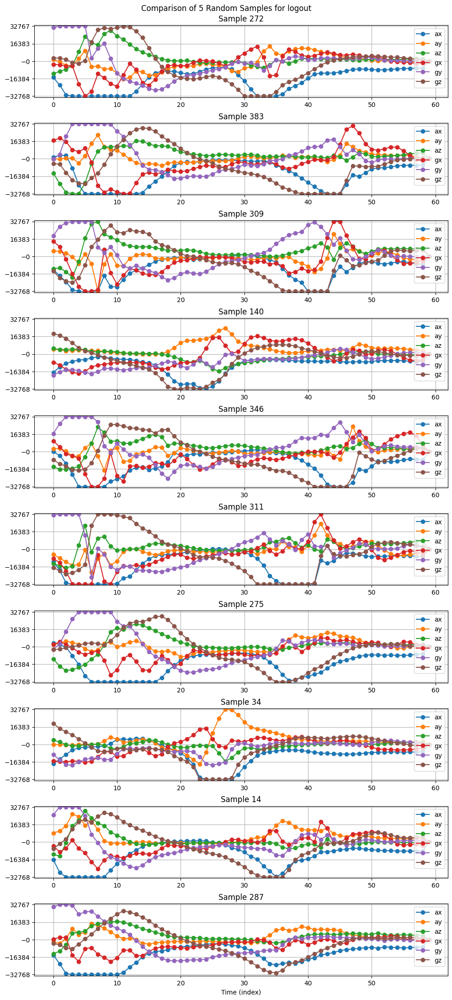

Y-axis limits: -32768.0 to 32767.0


/tmp/ipykernel_468732/2683713460.py:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xticks(np.arange(0, len(sample_data[0]), step=10))  # Adjust step size as needed


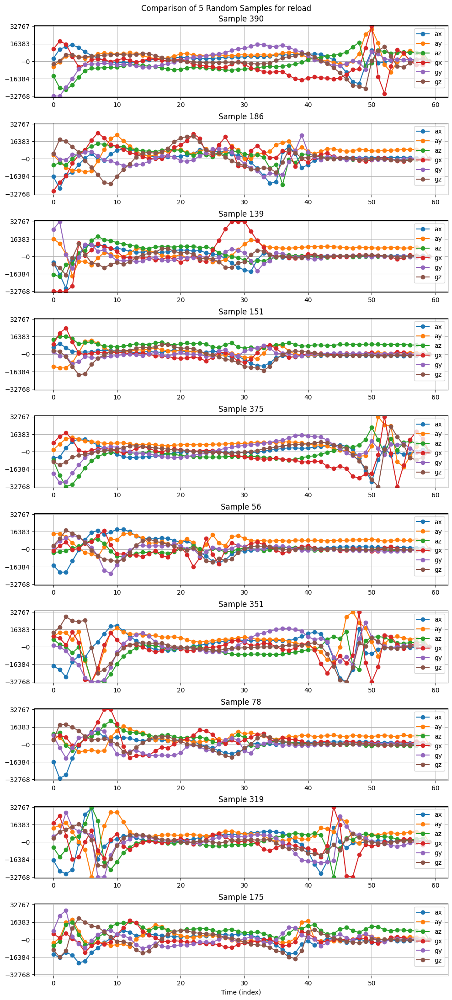

Y-axis limits: -32768.0 to 32767.0


/tmp/ipykernel_468732/2683713460.py:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xticks(np.arange(0, len(sample_data[0]), step=10))  # Adjust step size as needed


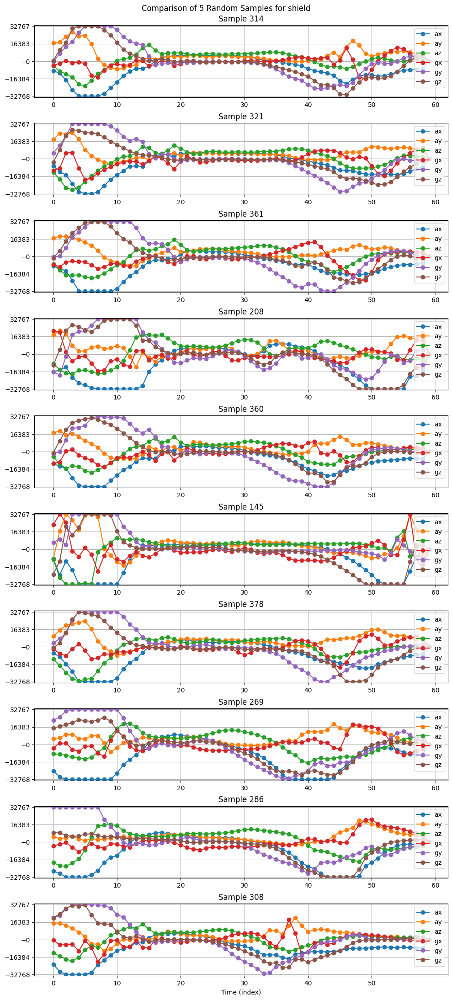

Y-axis limits: -32768.0 to 32767.0


/tmp/ipykernel_468732/2683713460.py:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xticks(np.arange(0, len(sample_data[0]), step=10))  # Adjust step size as needed


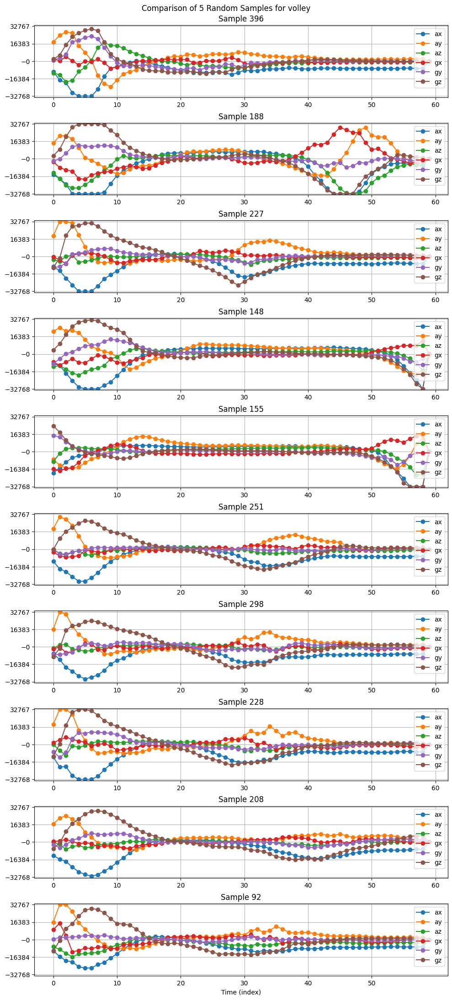

Y-axis limits: -32768.0 to 32767.0


/tmp/ipykernel_468732/2683713460.py:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xticks(np.arange(0, len(sample_data[0]), step=10))  # Adjust step size as needed


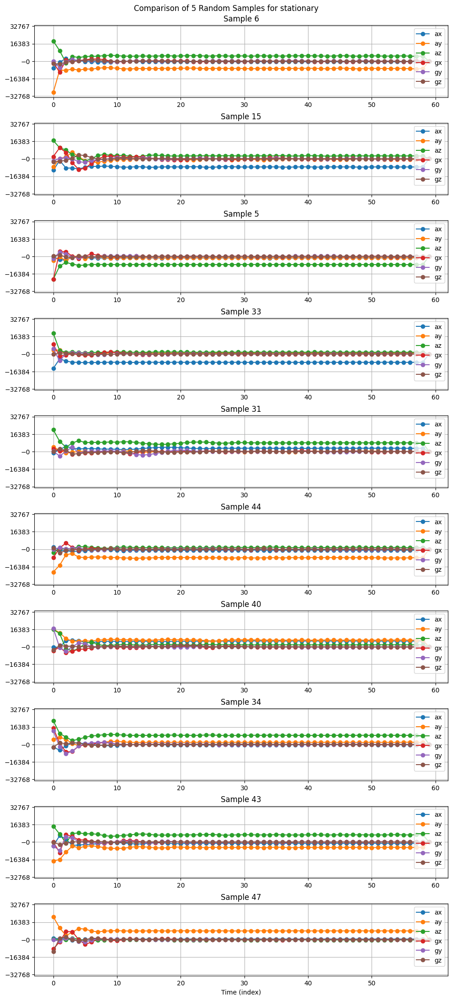

Y-axis limits: -32768.0 to 32767.0


/tmp/ipykernel_468732/2683713460.py:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xticks(np.arange(0, len(sample_data[0]), step=10))  # Adjust step size as needed


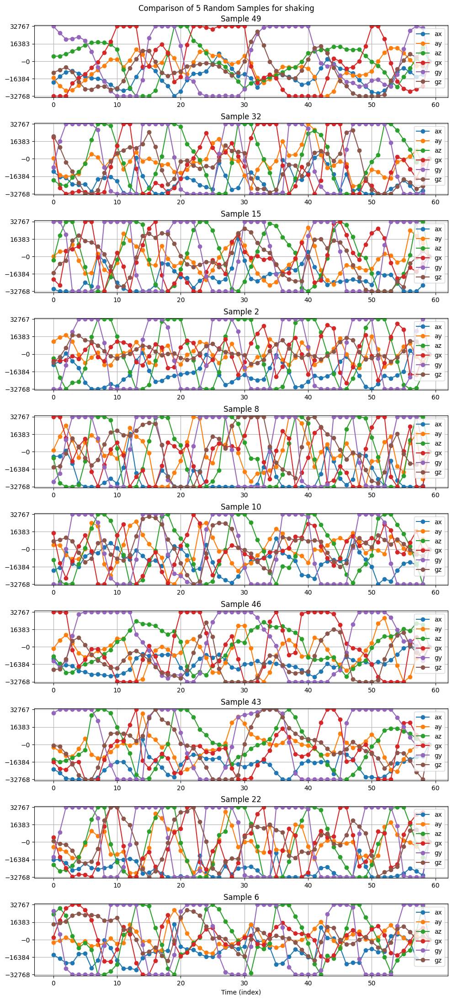

Y-axis limits: -32768.0 to 32767.0


/tmp/ipykernel_468732/2683713460.py:54: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.xticks(np.arange(0, len(sample_data[0]), step=10))  # Adjust step size as needed


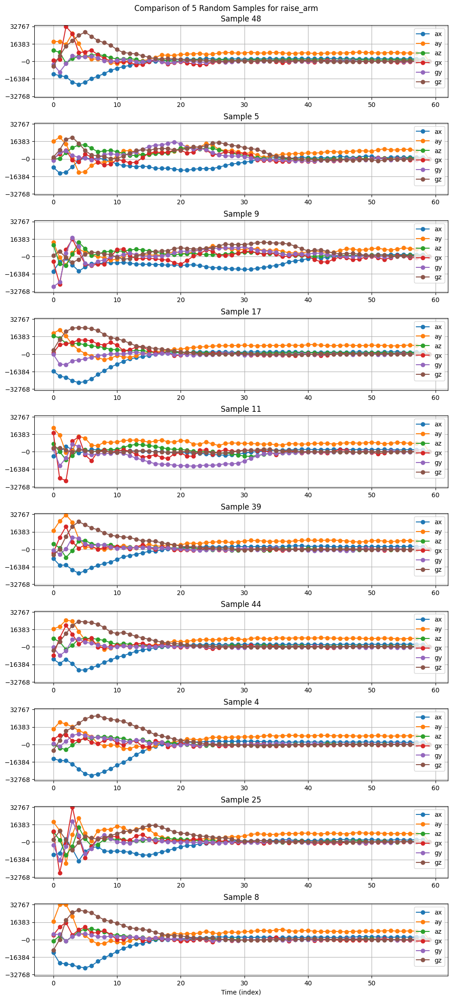

Y-axis limits: -32768.0 to 32767.0


In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random

# Load the data from the CSV file (assuming it's named 'data.csv' and has no header)
names = ['basket', 'bowl', 'bomb', 'logout', 'reload', 'shield', 'volley', 'stationary', 'shaking', 'raise_arm']
# names = ['soccer_1', 'soccer_2']

for name in names:
    file_path = f'new_data/hand/{name}.csv'  # Replace with your actual file path
    df = pd.read_csv(file_path, header=None)

    # Function to convert string to a list of floats
    def str_to_list(s):
        return [float(x.strip()) for x in s.strip('[]').split(',')]

    # Apply the function to each cell in the DataFrame to convert strings to lists
    for col in df.columns:
        df[col] = df[col].apply(str_to_list)

    # Assign column names based on the data description
    df.columns = ['ax', 'ay', 'az', 'gx', 'gy', 'gz']

    # Flatten the lists to calculate global min and max
    flat_values = df.apply(lambda col: np.concatenate(col.values))  # Flatten the lists with numpy
    y_min = flat_values.min().min()  # Get the overall min
    y_max = flat_values.max().max()  # Get the overall max

    # Select five random samples for plotting
    random_samples = random.sample(range(len(df)), 10)

    # Plot each sample in a different subplot
    fig, axs = plt.subplots(10, 1, figsize=(10, 25), sharex=False)
    fig.suptitle(f'Comparison of 5 Random Samples for {name}', y=0.95)  # Add padding for the title

    for i, sample_index in enumerate(random_samples):
        sample_data = df.iloc[sample_index]
        # Plot each axis (ax, ay, az, gx, gy, gz) in the same subplot
        for j, axis_data in enumerate(sample_data):
            axs[i].plot(axis_data, marker='o', label=df.columns[j])
        axs[i].set_title(f'Sample {sample_index + 1}')
        axs[i].legend(loc='upper right')
        axs[i].grid(True)
        axs[i].set_ylim(y_min - 1000, y_max + 1000)  # Add some padding to Y-axis limits

        # Explicitly add Y-axis ticks
        axs[i].set_yticks(np.linspace(y_min, y_max, 5))

    # Label X-axis with time or appropriate index
    plt.xlabel('Time (index)')

    # Force X-ticks to show up on the shared X-axis
    plt.xticks(np.arange(0, len(sample_data[0]), step=10))  # Adjust step size as needed

    # Improve padding/margin and layout
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to avoid overlap with title

    # Adjust the bottom margin so X-axis labels are visible
    plt.subplots_adjust(bottom=0.1)  # Increase this if needed to give more space to X-axis labels

    plt.show()

    # Print Y-axis limits for user reference
    print(f'Y-axis limits: {y_min} to {y_max}')


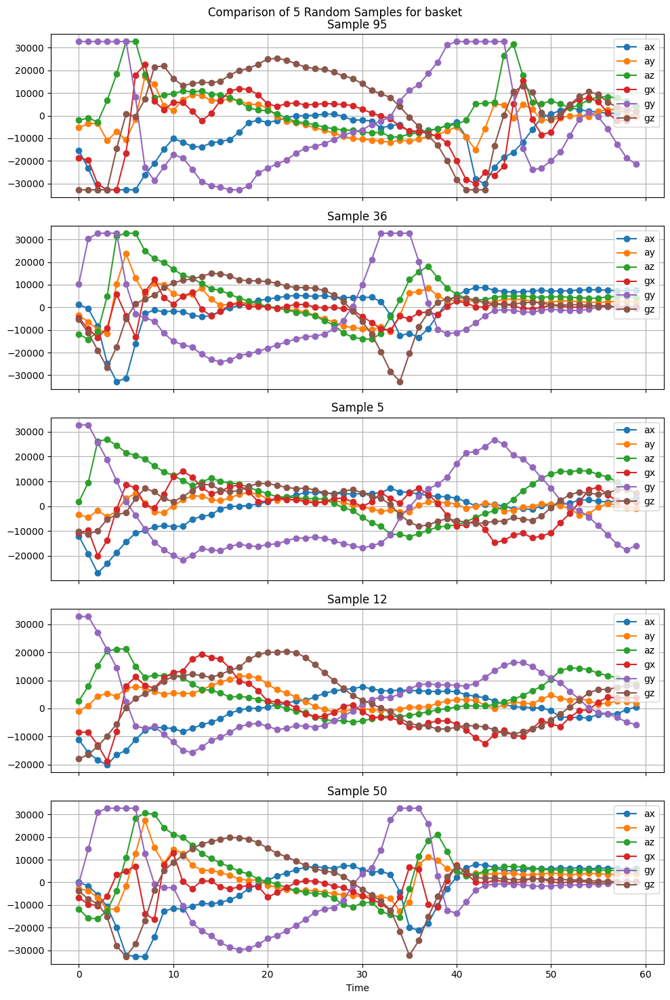

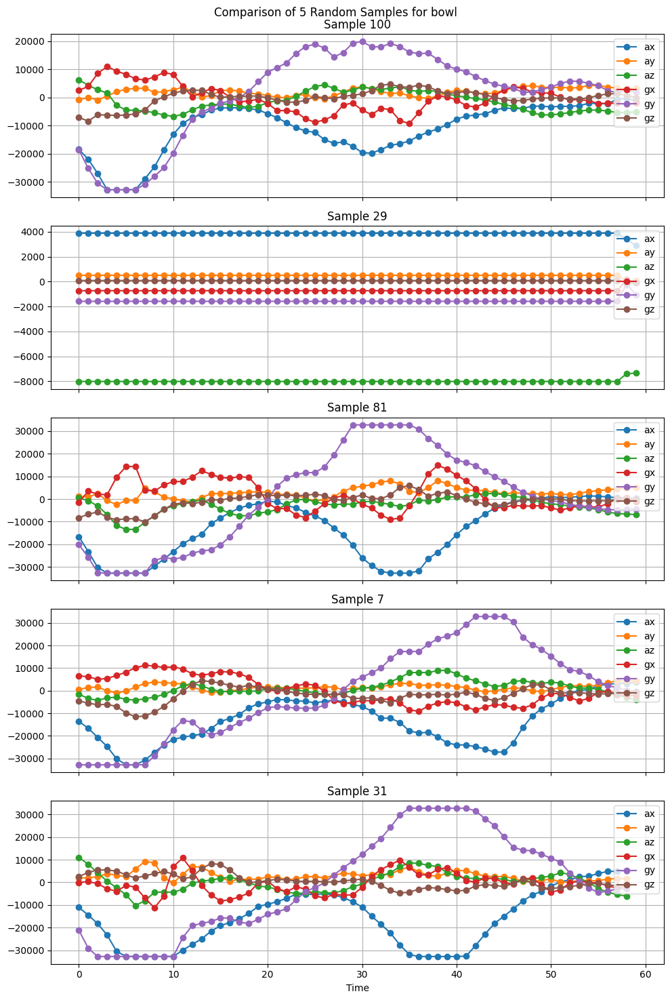

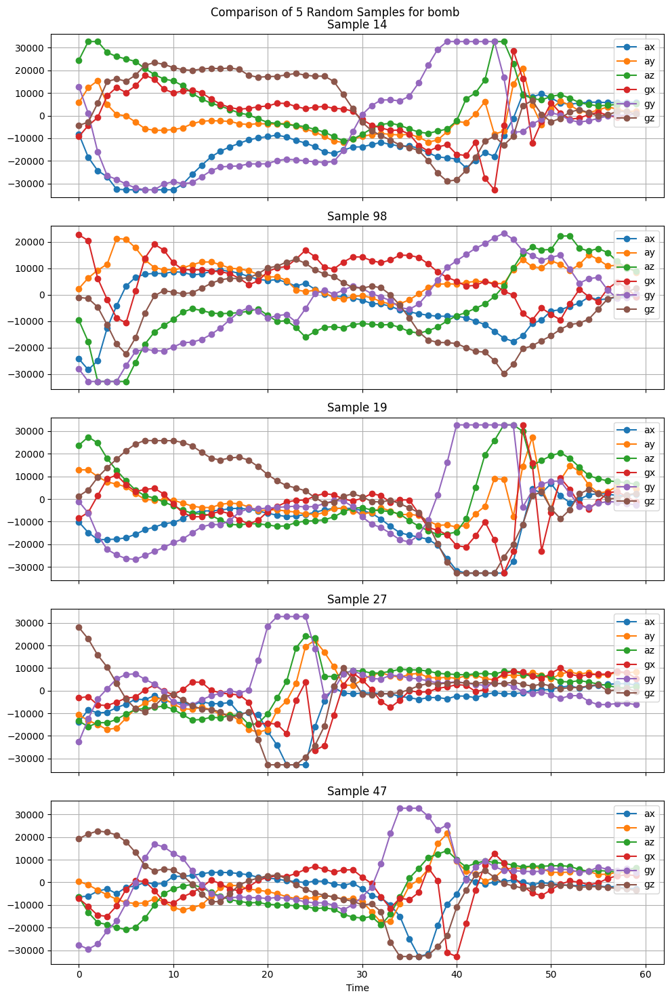

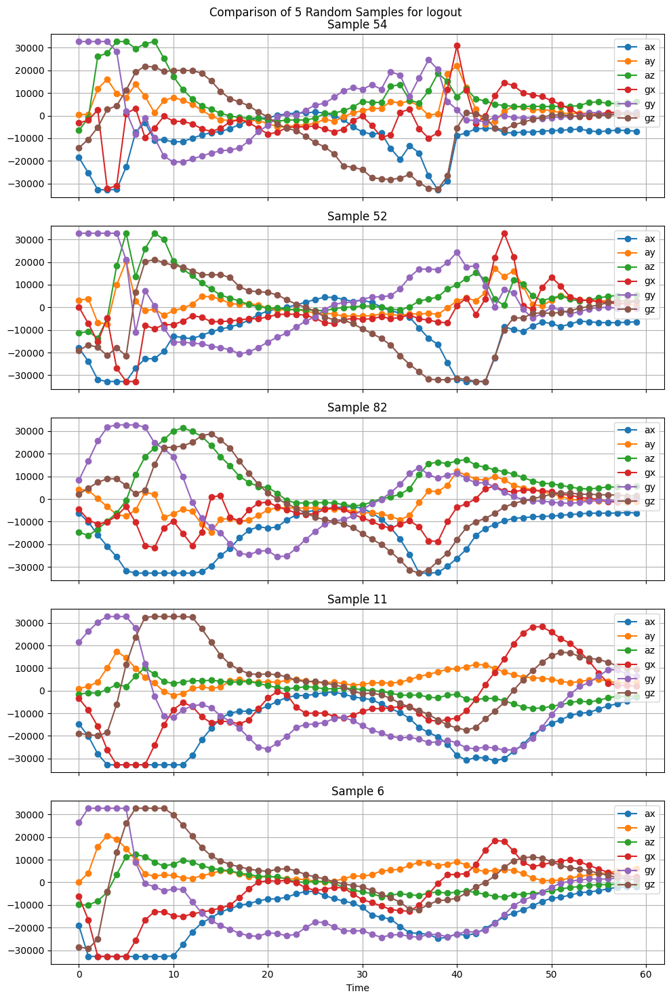

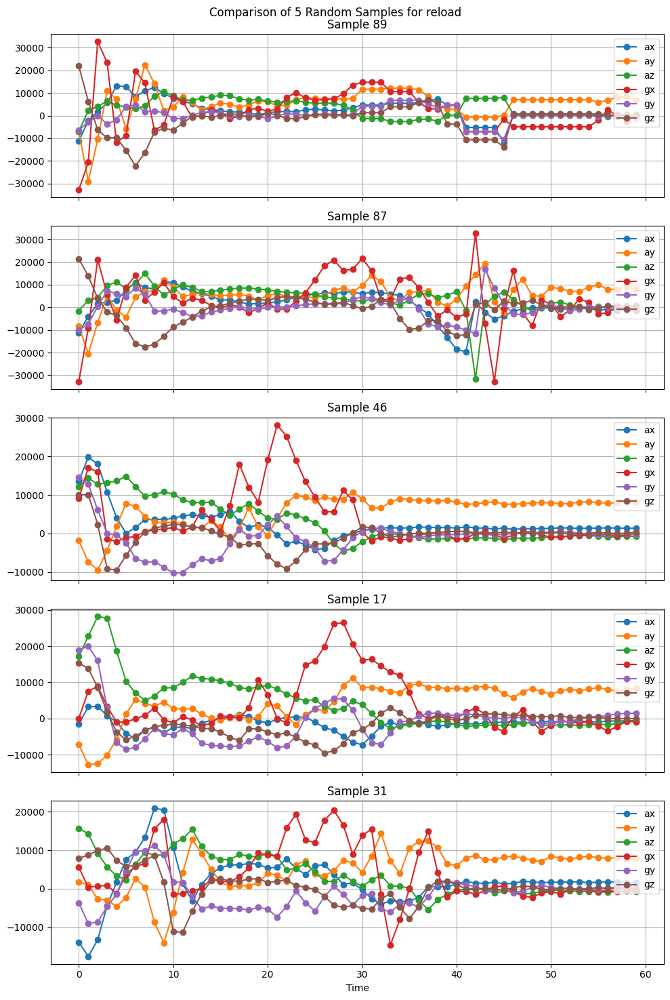

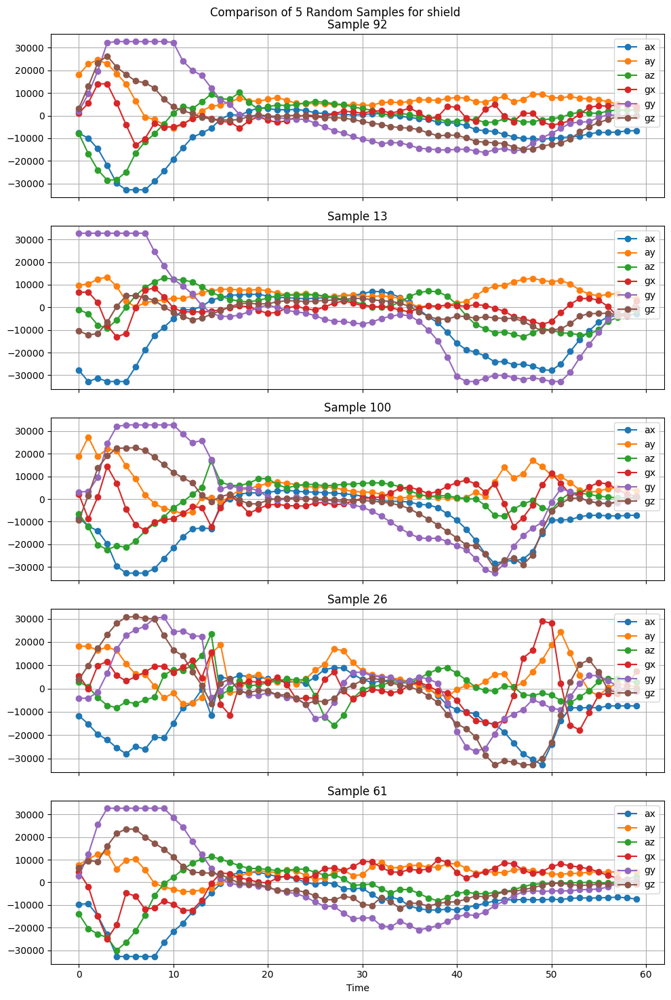

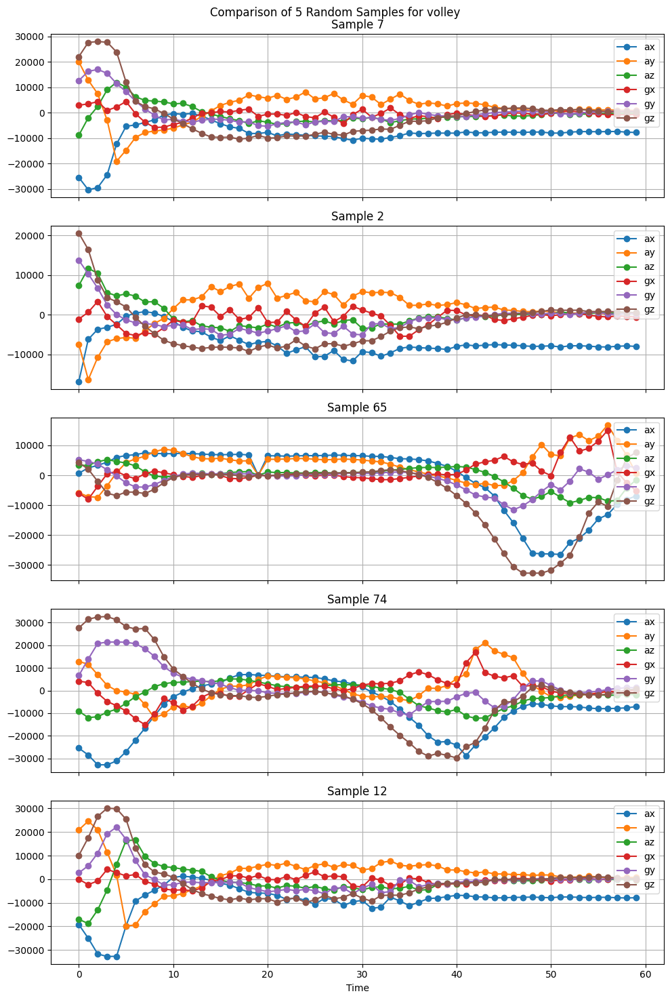

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import random

# Load the data from the CSV file (assuming it's named 'data.csv' and has no header)
names = ['basket', 'bowl', 'bomb', 'logout', 'reload', 'shield', 'volley']

for name in names:
    file_path = f'old_data/{name}.csv'  # Replace with your actual file path
    df = pd.read_csv(file_path, header=None)

    # Function to convert string to a list of floats
    def str_to_list(s):
        return [float(x.strip()) for x in s.strip('[]').split(',')]

    # Apply the function to each cell in the DataFrame to convert strings to lists
    for col in df.columns:
        df[col] = df[col].apply(str_to_list)

    # Assign column names based on the data description
    df.columns = ['ax', 'ay', 'az', 'gx', 'gy', 'gz']

    # Select five random samples for plotting
    random_samples = random.sample(range(len(df)), 5)

    # Plot each sample in a different subplot
    fig, axs = plt.subplots(5, 1, figsize=(10, 15), sharex=True)
    fig.suptitle(f'Comparison of 5 Random Samples for {name}')

    for i, sample_index in enumerate(random_samples):
        sample_data = df.iloc[sample_index]
        # Plot each axis (ax, ay, az, gx, gy, gz) in the same subplot
        for j, axis_data in enumerate(sample_data):
            axs[i].plot(axis_data, marker='o', label=df.columns[j])
        axs[i].set_title(f'Sample {sample_index + 1}')
        axs[i].legend(loc='upper right')
        axs[i].grid(True)

    plt.xlabel('Time')
    plt.tight_layout()
    plt.show()

